# The advection equation
Numerical solution of the 1D advection problem
$$ \frac{\partial T}{\partial t} =  -c \frac{\partial T}{\partial x}$$ 
using an explicit forward in time, centred in space scheme

$T(x,t)$ represents the evolution of temperature distribution along the estuary over time

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

## User defined parameters

In [6]:
# problem parameters
c=0.5       # Advection speed [m s-1]
dx=200      # X resolution [m]
dt=200      # time step [s]
t0=0.       # initial time
tmax=0.1    # duration of simulation [days]
xmax=10.0e3 # length of the basin [m]

# Parameters of the initial temperature distribution
T0 = 15.        # baseline temperature [degC]
sigma = 2000.   # width at half amplitude [m]
A = 5.          # amplitude [degC]

## Initial function and grid specifications
The initial shape of the temperature distribution is a Gaussian peak function

In [9]:
# Spatial shape of the temperature disturbance
def Gaussian(x):
    y = T0+A*np.exp(-(x/sigma)**2)
    return y

The resulting space-time grid depends on the parameters above

In [12]:
# time axis
NT = int(np.floor(tmax*86400/dt))+1  # number of steps (starts from 0)
# X axis (centred at 0)
x = np.arange(-xmax,xmax,dx)
IM = len(x)             # number of grid points
T = np.zeros([IM,NT])     # the array holding the numerical solution 
print('Grid steps : ',IM)
print('Number of time steps : ',NT)
print('Timestep = ',dt,' s')
print('Max numerical speed DX/DT = ',dx/dt,' m/s')
print('Physical speed = ',c,' m/s')
print('Courant number = ',c*dt/dx)

Grid steps :  100
Number of time steps :  44
Timestep =  200  s
Max numerical speed DX/DT =  1.0  m/s
Physical speed =  0.5  m/s
Courant number =  0.5


## Numerical solution
Note that this code stores the solution at all times in array T for educational purposes. This allows to plot the solution at the different time steps and see how it evolves.

*This method is very inefficient for any application because it uses a lot of memory. In modern computer codes only a few time records are hold in memory. The instantaneous solution is often temporarely stored for computing time averages and then discarded.*

This part of the code is the topic of some questions found in the lecture notes

In [17]:
# Compute the numerical solution using a time loop over the number of time steps
T[:,0] = Gaussian(x)    # initial condition

for n in range(NT-1): #all the future time steps 
    # Question 1
    T[0,n+1]  = T0 
    T[-1,n+1] = T0
    # Question 2 and Question 3
    rhs = -c*(T[2:,n]-T[:-2,n])/(2.*dx) # L1
    T[1:-1,n+1] = T[1:-1,n] + rhs*dt    # L2

#### Question 1:

It is setting up the boundary conditions for the equation. This means that the first value of the matrix/array is set to T0 and the last value in the matrix is set to T0. This means that the temperature gets constrained at a specific boundary in order to calculate the next time step values, these boundary conditions are required. The first line sets the first condition for the left edge and the second line sets the condition for the right edge of the formula. These boundary conditions confine the pertubation/propogation of the function to what is desired/expected by constraining it between the upper and lower condition. The function occurs between the boundary conditions and returns to these values over time, which T0. 

#### Question 2: 

The discretisation of the scheme occurs in line 1. It is based on being forward in time and centered in space. It is a first order partial differential equation, for the right hand side. It is approximately equal to the change in temperature over the change in time - the gradient of the differential. 

In line 2, the whole PDE has been rearranged and solving for the temperature at the future timestep (i = 1:-1,n+1). We are solving for the unknown, the future time step we are interested in. All of the components are still discretised. 

#### Question 3: 

The reason for this is because there has been boundary conditions set at T[0, n+1] and T[-1, n+1]. These set the computation to occur between this. Looking at Line 1 of the code, the T[:-2,n], means you compute from the second last (from the value next to the upper boundary) to T[2:,n] which is the third value onwards (two values from the lower boundary condition). The result is the space-centered difference in temperature. So, this means that the function has to compute between the boundaries. Due to making the time steps in Line 2, each value computed needs a neighbour for the computation to work. Therefore, the code cannot run over all values as in order to get results, each value needs a neighbour and by setting these conditions this ensures the code will run. This value T[1:-1,n] refers to the current temperature, across all values. The function in the line above constrains the values, whereas this term just represents the temperature now. 

## Plot the result using a matplotlib animation
The animation below displays the evolution of the solution and compares it with the analytical solution

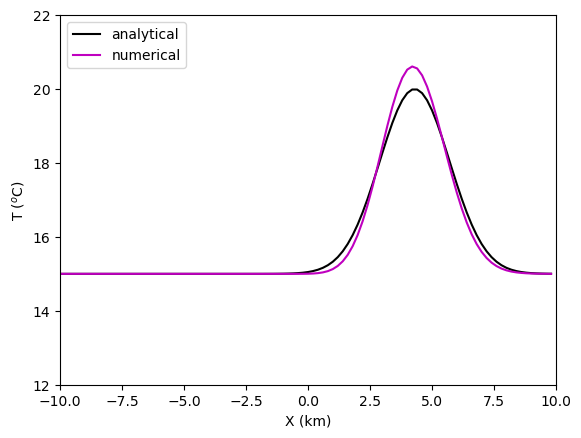

In [20]:
fig, ax = plt.subplots()
# set the axis limits
plt.axis([-xmax/1000, xmax/1000, T0-3, T0+7])
# first plot the initial conditions and set the line attributes
line, = ax.plot(x/1000., Gaussian(x),'k',label='analytical')
sol, = ax.plot(x/1000., T[:,0],'m',label='numerical')
ax.set_xlabel('X (km)')
ax.set_ylabel('T ($^o$C)')
plt.legend(loc='upper left')

def animate(i):
    t = t0 + i*dt
    line.set_ydata(Gaussian(x-c*t))  # update the analytical solution
    sol.set_ydata(T[:,i])  # update the numerical solution
    return line,sol,

# create the animation and loop (interval is in ms)
ani = animation.FuncAnimation(
    fig, animate, interval=dt, blit=True, frames=NT, repeat=True)

# To save the animation, use e.g.
# ani.save("movie.mp4")
# or
# writer = animation.FFMpegWriter(
#     fps=15, metadata=dict(artist='Me'), bitrate=1800)
# ani.save("movie.mp4", writer=writer)

# display the animation as a javascript object embedded in the notebook
from IPython.display import HTML
HTML(ani.to_jshtml())

#### Question 4:

Both of the solutions begin at the same size and position. As time progresses, the numerical solution becomes larger than the analytical solution, the amplitude of the function increases. The maintain the same speed however the numerical curve does becomes narrower and has its amplitude shifted to the left slightly but mostly due to the amplitude increase and therefore spread increase. The numerical solution diverges from the analytical solution. A reason for this could be due to the truncation errors, which become additive each time the solution is iterated over the loop. In theory, the analytical solution has no error whereas the numerical solution does. 

#### Question 5: 


Grid steps :  200
Number of time steps :  44
Timestep =  200  s
Max numerical speed DX/DT =  0.5  m/s
Physical speed =  0.5  m/s
Courant number =  1.0


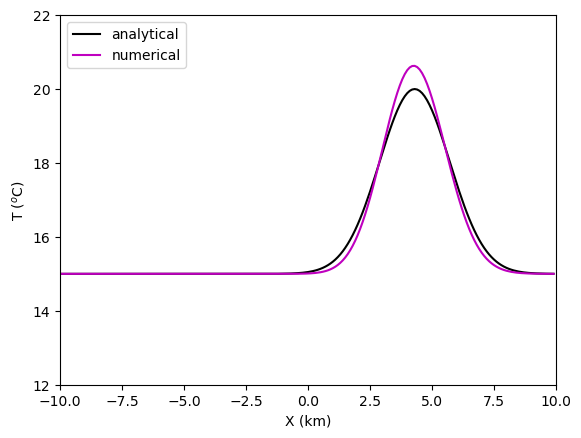

In [39]:
# problem parameters
c=0.5       # Advection speed [m s-1]
dx=100      # X resolution [m]
dt=200      # time step [s]
t0=0.       # initial time
tmax=0.1    # duration of simulation [days]
xmax=10.0e3 # length of the basin [m]

# Parameters of the initial temperature distribution
T0 = 15.        # baseline temperature [degC]
sigma = 2000.   # width at half amplitude [m]
A = 5.          # amplitude [degC]

# Spatial shape of the temperature disturbance
def Gaussian(x):
    y = T0+A*np.exp(-(x/sigma)**2)
    return y
# time axis
NT = int(np.floor(tmax*86400/dt))+1  # number of steps (starts from 0)
# X axis (centred at 0)
x = np.arange(-xmax,xmax,dx)
IM = len(x)             # number of grid points
T = np.zeros([IM,NT])     # the array holding the numerical solution 
print('Grid steps : ',IM)
print('Number of time steps : ',NT)
print('Timestep = ',dt,' s')
print('Max numerical speed DX/DT = ',dx/dt,' m/s')
print('Physical speed = ',c,' m/s')
print('Courant number = ',c*dt/dx)

# Compute the numerical solution using a time loop over the number of time steps
T[:,0] = Gaussian(x)    # initial condition

for n in range(NT-1): #all the future time steps 
    # Question 1
    T[0,n+1]  = T0 
    T[-1,n+1] = T0
    # Question 2 and Question 3
    rhs = -c*(T[2:,n]-T[:-2,n])/(2.*dx) # L1
    T[1:-1,n+1] = T[1:-1,n] + rhs*dt    # L2
    
fig, ax = plt.subplots()
# set the axis limits
plt.axis([-xmax/1000, xmax/1000, T0-3, T0+7])
# first plot the initial conditions and set the line attributes
line, = ax.plot(x/1000., Gaussian(x),'k',label='analytical')
sol, = ax.plot(x/1000., T[:,0],'m',label='numerical')
ax.set_xlabel('X (km)')
ax.set_ylabel('T ($^o$C)')
plt.legend(loc='upper left')

def animate(i):
    t = t0 + i*dt
    line.set_ydata(Gaussian(x-c*t))  # update the analytical solution
    sol.set_ydata(T[:,i])  # update the numerical solution
    return line,sol,

# create the animation and loop (interval is in ms)
ani = animation.FuncAnimation(
    fig, animate, interval=dt, blit=True, frames=NT, repeat=True)

# To save the animation, use e.g.
# ani.save("movie.mp4")
# or
# writer = animation.FFMpegWriter(
#     fps=15, metadata=dict(artist='Me'), bitrate=1800)
# ani.save("movie.mp4", writer=writer)

# display the animation as a javascript object embedded in the notebook
from IPython.display import HTML
HTML(ani.to_jshtml())

Grid steps :  40
Number of time steps :  87
Timestep =  100  s
Max numerical speed DX/DT =  5.0  m/s
Physical speed =  0.5  m/s
Courant number =  0.1


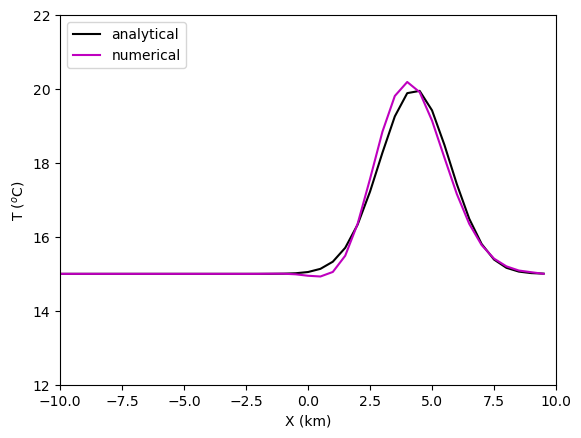

In [35]:
# problem parameters
c=0.5       # Advection speed [m s-1]
dx=500      # X resolution [m]
dt=100      # time step [s]
t0=0.       # initial time
tmax=0.1    # duration of simulation [days]
xmax=10.0e3 # length of the basin [m]

# Parameters of the initial temperature distribution
T0 = 15.        # baseline temperature [degC]
sigma = 2000.   # width at half amplitude [m]
A = 5.          # amplitude [degC]

# Spatial shape of the temperature disturbance
def Gaussian(x):
    y = T0+A*np.exp(-(x/sigma)**2)
    return y
    
# time axis
NT = int(np.floor(tmax*86400/dt))+1  # number of steps (starts from 0)
# X axis (centred at 0)
x = np.arange(-xmax,xmax,dx)
IM = len(x)             # number of grid points
T = np.zeros([IM,NT])     # the array holding the numerical solution 
print('Grid steps : ',IM)
print('Number of time steps : ',NT)
print('Timestep = ',dt,' s')
print('Max numerical speed DX/DT = ',dx/dt,' m/s')
print('Physical speed = ',c,' m/s')
print('Courant number = ',c*dt/dx)

# Compute the numerical solution using a time loop over the number of time steps
T[:,0] = Gaussian(x)    # initial condition

for n in range(NT-1): #all the future time steps 
    # Question 1
    T[0,n+1]  = T0 
    T[-1,n+1] = T0
    # Question 2 and Question 3
    rhs = -c*(T[2:,n]-T[:-2,n])/(2.*dx) # L1
    T[1:-1,n+1] = T[1:-1,n] + rhs*dt    # L2
    
fig, ax = plt.subplots()
# set the axis limits
plt.axis([-xmax/1000, xmax/1000, T0-3, T0+7])
# first plot the initial conditions and set the line attributes
line, = ax.plot(x/1000., Gaussian(x),'k',label='analytical')
sol, = ax.plot(x/1000., T[:,0],'m',label='numerical')
ax.set_xlabel('X (km)')
ax.set_ylabel('T ($^o$C)')
plt.legend(loc='upper left')

def animate(i):
    t = t0 + i*dt
    line.set_ydata(Gaussian(x-c*t))  # update the analytical solution
    sol.set_ydata(T[:,i])  # update the numerical solution
    return line,sol,

# create the animation and loop (interval is in ms)
ani = animation.FuncAnimation(
    fig, animate, interval=dt, blit=True, frames=NT, repeat=True)

# To save the animation, use e.g.
# ani.save("movie.mp4")
# or
# writer = animation.FFMpegWriter(
#     fps=15, metadata=dict(artist='Me'), bitrate=1800)
# ani.save("movie.mp4", writer=writer)

# display the animation as a javascript object embedded in the notebook
from IPython.display import HTML
HTML(ani.to_jshtml())

For the first part, by halving dx there seems to be no major difference between the plots. The amplitude of the numerical solution does seem to increase over time and then continues to travel at the same speed as the analytical solution. Therefore, there is no major difference when halving dx to get the Courant number equal to 1. 

For the second part, by increasing the dx and decreasing the dt, there will be a change to the Courant number quite a bit. The speed of the numerical solution does seem to slow over time. There is a slight increase in the amplitude above the analytical solution, most likely due to the increase in errors. There is also a noticebale divergence of the numerical solution from the analytical solution on the left hand side of the function in the graph below. Overall the scheme is stable above but due to the Courant, the numerical solution does seem to lag behind and smear more compared to the analytical solution however it is stable.  

#### Question 6:

Grid steps :  100
Number of time steps :  44
Timestep =  200  s
Max numerical speed DX/DT =  1.0  m/s
Physical speed =  0.5  m/s
Courant number =  0.5


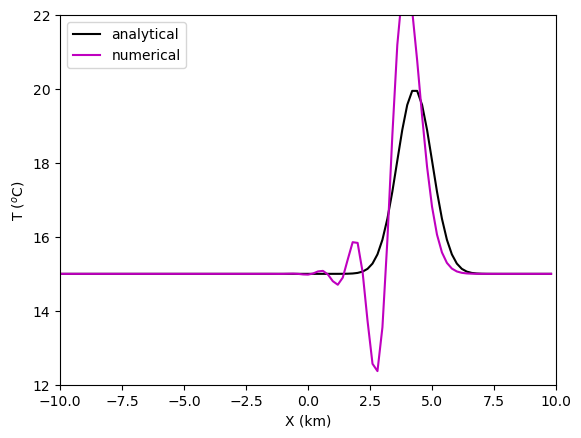

In [43]:
# problem parameters
c=0.5       # Advection speed [m s-1]
dx=200      # X resolution [m]
dt=200      # time step [s]
t0=0.       # initial time
tmax=0.1    # duration of simulation [days]
xmax=10.0e3 # length of the basin [m]

# Parameters of the initial temperature distribution
T0 = 15.        # baseline temperature [degC]
sigma = 1000.   # width at half amplitude [m]
A = 5.          # amplitude [degC]

# Spatial shape of the temperature disturbance
def Gaussian(x):
    y = T0+A*np.exp(-(x/sigma)**2)
    return y
    
# time axis
NT = int(np.floor(tmax*86400/dt))+1  # number of steps (starts from 0)
# X axis (centred at 0)
x = np.arange(-xmax,xmax,dx)
IM = len(x)             # number of grid points
T = np.zeros([IM,NT])     # the array holding the numerical solution 
print('Grid steps : ',IM)
print('Number of time steps : ',NT)
print('Timestep = ',dt,' s')
print('Max numerical speed DX/DT = ',dx/dt,' m/s')
print('Physical speed = ',c,' m/s')
print('Courant number = ',c*dt/dx)

# Compute the numerical solution using a time loop over the number of time steps
T[:,0] = Gaussian(x)    # initial condition

for n in range(NT-1): #all the future time steps 
    # Question 1
    T[0,n+1]  = T0 
    T[-1,n+1] = T0
    # Question 2 and Question 3
    rhs = -c*(T[2:,n]-T[:-2,n])/(2.*dx) # L1
    T[1:-1,n+1] = T[1:-1,n] + rhs*dt    # L2
    
fig, ax = plt.subplots()
# set the axis limits
plt.axis([-xmax/1000, xmax/1000, T0-3, T0+7])
# first plot the initial conditions and set the line attributes
line, = ax.plot(x/1000., Gaussian(x),'k',label='analytical')
sol, = ax.plot(x/1000., T[:,0],'m',label='numerical')
ax.set_xlabel('X (km)')
ax.set_ylabel('T ($^o$C)')
plt.legend(loc='upper left')

def animate(i):
    t = t0 + i*dt
    line.set_ydata(Gaussian(x-c*t))  # update the analytical solution
    sol.set_ydata(T[:,i])  # update the numerical solution
    return line,sol,

# create the animation and loop (interval is in ms)
ani = animation.FuncAnimation(
    fig, animate, interval=dt, blit=True, frames=NT, repeat=True)

# To save the animation, use e.g.
# ani.save("movie.mp4")
# or
# writer = animation.FFMpegWriter(
#     fps=15, metadata=dict(artist='Me'), bitrate=1800)
# ani.save("movie.mp4", writer=writer)

# display the animation as a javascript object embedded in the notebook
from IPython.display import HTML
HTML(ani.to_jshtml())

A narrower sigma value causes there to be sharper gradients and then it is more difficult to solve the features of the graph. A way to counteract this could be by decreasing dx to a smaller value, or trying to increase the timestep. When decreasing dx, the exponential factor does need to be taken into account otherwise it won't be accurate. 

Grid steps :  100
Number of time steps :  44
Timestep =  200  s
Max numerical speed DX/DT =  1.0  m/s
Physical speed =  1  m/s
Courant number =  1.0


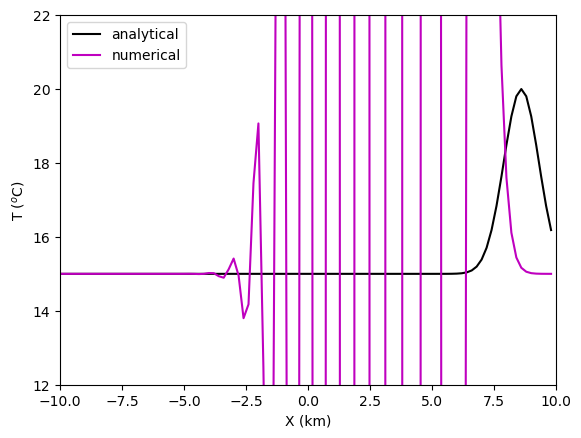

In [48]:
# problem parameters
c=1       # Advection speed [m s-1]
dx=200      # X resolution [m]
dt=200      # time step [s]
t0=0.       # initial time
tmax=0.1    # duration of simulation [days]
xmax=10.0e3 # length of the basin [m]

# Parameters of the initial temperature distribution
T0 = 15.        # baseline temperature [degC]
sigma = 1000.   # width at half amplitude [m]
A = 5.          # amplitude [degC]

# Spatial shape of the temperature disturbance
def Gaussian(x):
    y = T0+A*np.exp(-(x/sigma)**2)
    return y
    
# time axis
NT = int(np.floor(tmax*86400/dt))+1  # number of steps (starts from 0)
# X axis (centred at 0)
x = np.arange(-xmax,xmax,dx)
IM = len(x)             # number of grid points
T = np.zeros([IM,NT])     # the array holding the numerical solution 
print('Grid steps : ',IM)
print('Number of time steps : ',NT)
print('Timestep = ',dt,' s')
print('Max numerical speed DX/DT = ',dx/dt,' m/s')
print('Physical speed = ',c,' m/s')
print('Courant number = ',c*dt/dx)

# Compute the numerical solution using a time loop over the number of time steps
T[:,0] = Gaussian(x)    # initial condition

for n in range(NT-1): #all the future time steps 
    # Question 1
    T[0,n+1]  = T0 
    T[-1,n+1] = T0
    # Question 2 and Question 3
    rhs = -c*(T[2:,n]-T[:-2,n])/(2.*dx) # L1
    T[1:-1,n+1] = T[1:-1,n] + rhs*dt    # L2
    
fig, ax = plt.subplots()
# set the axis limits
plt.axis([-xmax/1000, xmax/1000, T0-3, T0+7])
# first plot the initial conditions and set the line attributes
line, = ax.plot(x/1000., Gaussian(x),'k',label='analytical')
sol, = ax.plot(x/1000., T[:,0],'m',label='numerical')
ax.set_xlabel('X (km)')
ax.set_ylabel('T ($^o$C)')
plt.legend(loc='upper left')

def animate(i):
    t = t0 + i*dt
    line.set_ydata(Gaussian(x-c*t))  # update the analytical solution
    sol.set_ydata(T[:,i])  # update the numerical solution
    return line,sol,

# create the animation and loop (interval is in ms)
ani = animation.FuncAnimation(
    fig, animate, interval=dt, blit=True, frames=NT, repeat=True)

# To save the animation, use e.g.
# ani.save("movie.mp4")
# or
# writer = animation.FFMpegWriter(
#     fps=15, metadata=dict(artist='Me'), bitrate=1800)
# ani.save("movie.mp4", writer=writer)

# display the animation as a javascript object embedded in the notebook
from IPython.display import HTML
HTML(ani.to_jshtml())

By doubling the current speed from 0.5-1, the Courant number also increases 0.5 - 1.0. My increasing the current speed, there is then an increase in the amount of times the function is run compared to the timestep and the analystical solution. This graph has mutliple troughs and peaks of the curve for the timestep provided. This means that there could be more diffusion taking place or phase errors which causes this major divergence from the analytical solution. 